In [1]:
import pandas as pd          ## To Handle the file
import numpy as np           ### For Numerical Calculations
import matplotlib.pyplot as plt  #### For Visulaizations
import seaborn as sns          ### For statistical visualization

#### Data loading and preparation:

In [3]:
### Loading the dataset and inspecting its structure.

In [4]:
df=pd.read_excel("Fuel.xlsx")

In [5]:
df

,uniqueid,ts,lat,lng,external_bat_voltage,internal_bat_voltage,engineload,tanklevel,throttle,coolant,...,live_location,to_be_expired_at,status,event_id,particulated_trap_inlet_pressure,boost_pressure,intake_manifold_1_temperature,air_inlet_pressure,exhaust_gas_temperature,adblue_level
0,it_220403501,1709340731,19.069340,78.355148,NaN,NaN,28,NaN,NaN,33,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,it_220403501,1709340794,19.069347,78.355141,NaN,NaN,22,NaN,NaN,41,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,it_220403501,1709340857,19.069414,78.355179,NaN,NaN,25,NaN,NaN,48,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,it_220403501,1709340920,19.069258,78.355225,NaN,NaN,35,NaN,NaN,52,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,it_220403501,1709340983,19.069094,78.355339,NaN,NaN,0,NaN,NaN,57,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18429,it_220403501,1713635865,18.869371,79.020393,NaN,NaN,50,NaN,NaN,89,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.8
18430,it_220403501,1713635929,18.867130,79.018272,NaN,NaN,0,NaN,NaN,92,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.8
18431,it_220403501,1713635993,18.862076,79.013924,NaN,NaN,10,NaN,NaN,87,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.8
18432,it_220403501,1713636056,18.859493,79.011673,NaN,NaN,52,NaN,NaN,87,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.8


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18434 entries, 0 to 18433
Columns: 141 entries, uniqueid to adblue_level
dtypes: float64(122), int64(13), object(6)
memory usage: 19.8+ MB


In [7]:
### Identify the types of variables (numerical, categorical, etc.).

In [8]:
cat_col=[i for i in df.columns if df[i].dtype=='O']
num_col=[i for i in df.columns if df[i].dtype!='O']

In [9]:
## Numerical Variables

In [10]:
num_col

['ts',
 'lat',
 'lng',
 'external_bat_voltage',
 'internal_bat_voltage',
 'engineload',
 'tanklevel',
 'throttle',
 'coolant',
 'intakeairtemp',
 'engineoiltemp',
 'imap',
 'vehiclespeed',
 'warmups',
 'rpm',
 'obddistance',
 'maf',
 'fuelrail',
 'runtime',
 'mil',
 'obdstandards',
 'telltale',
 'pto_drive_engagement',
 'engine_torque_percent',
 'service_distance',
 'gross_combination_vehicle_weight',
 'selected_gear',
 'current_gear',
 'fuel_consumption',
 'fuel_level',
 'fl_level',
 'fuel_rate',
 'fuel_economy',
 'accelerator_pedal_pos',
 'vehicle_weight',
 'air_suspension_pressure_front_axle_left',
 'air_suspension_pressure_front_axle_right',
 'air_suspension_pressure_rear_axle_left',
 'air_suspension_pressure_rear_axle_right',
 'state_of_charge',
 'battery_pack_voltage',
 'battery_pack_current',
 'power',
 'lamp_status',
 'hydraulic_oil_filter',
 'air_filter',
 'no_charging',
 'low_fuel',
 'engine_temp_high',
 'hydraulic_oil_temp_high',
 'water_in_fuel',
 'low_oil_pressure',
 'roll

In [11]:
### Identifying the Categorical variables

In [12]:
cat_col

['uniqueid',
 'pluscode',
 'can_raw_data',
 'brake_switch_status',
 'clutch_switch_status',
 'parking_switch_status']

In [13]:
#### Determine the size of the dataset (number of rows and columns).

In [14]:
num_rows,num_columns=df.shape

In [15]:
## Number Of rows

In [16]:
num_rows

18434

In [17]:
### Identifying the number of columns

In [18]:
num_columns

141

In [19]:
#### Identify missing values and any irregularities in the data.

In [20]:
df.isnull().sum()    ### Identifying the Missing Values

uniqueid                             0
ts                                   0
lat                                  0
lng                                  0
external_bat_voltage             18434
                                 ...  
boost_pressure                   18434
intake_manifold_1_temperature    18434
air_inlet_pressure               18434
exhaust_gas_temperature          18434
adblue_level                      3664
Length: 141, dtype: int64

In [21]:
df.isna().any().any()     ### Identifying the NAN Values

True

In [22]:
df.isnull().sum()/len(df)            ### Identifying the Percentage of missing values in each column

uniqueid                         0.000000
ts                               0.000000
lat                              0.000000
lng                              0.000000
external_bat_voltage             1.000000
                                   ...   
boost_pressure                   1.000000
intake_manifold_1_temperature    1.000000
air_inlet_pressure               1.000000
exhaust_gas_temperature          1.000000
adblue_level                     0.198763
Length: 141, dtype: float64

In [23]:
df.duplicated().sum()    ### Identifying the Duplicate Values

0

### Data cleaning and preprocessing:

In [25]:
### Handle missing values appropriately.

In [26]:
df.isnull().sum()/len(df)>0.70   ### Checking the columns with more than 70% missing values

uniqueid                         False
ts                               False
lat                              False
lng                              False
external_bat_voltage              True
                                 ...  
boost_pressure                    True
intake_manifold_1_temperature     True
air_inlet_pressure                True
exhaust_gas_temperature           True
adblue_level                     False
Length: 141, dtype: bool

In [27]:
# Calculate the percentage of missing values in each column
missing_percentage = (df.isnull().sum() / len(df)) * 100

# Filter columns with 70% or more missing values
columns_missing = missing_percentage[missing_percentage >= 70].index

# Display the column names
print("Columns with 70% or more missing values:")
print(columns_missing)

Columns with 70% or more missing values:
Index(['external_bat_voltage', 'internal_bat_voltage', 'tanklevel', 'throttle',
       'intakeairtemp', 'imap', 'warmups', 'maf', 'fuelrail', 'mil',
       ...
       'request_id', 'live_location', 'to_be_expired_at', 'status', 'event_id',
       'particulated_trap_inlet_pressure', 'boost_pressure',
       'intake_manifold_1_temperature', 'air_inlet_pressure',
       'exhaust_gas_temperature'],
      dtype='object', length=108)


In [28]:
df.drop(columns=columns_missing,inplace=True)

In [29]:
df

,uniqueid,ts,lat,lng,engineload,coolant,engineoiltemp,vehiclespeed,rpm,obddistance,...,engine_throttle_valve1_pos,engine_throttle_valve2_pos,enginefueltemp,drivers_demand_engine_torque_percent,engine_torque_mode,accelerator_pedal_pos_2,brake_switch_status,clutch_switch_status,parking_switch_status,adblue_level
0,it_220403501,1709340731,19.069340,78.355148,28,33,1774.9688,0.00000,749.000,60780800,...,100.0,102,215,0,1,102,Released,Released,Pressed,NaN
1,it_220403501,1709340794,19.069347,78.355141,22,41,1774.9688,0.00000,1208.375,60780800,...,99.6,102,215,19,2,102,Released,Pressed,Pressed,NaN
2,it_220403501,1709340857,19.069414,78.355179,25,48,1774.9688,1.40625,752.625,60780800,...,99.6,102,215,0,1,102,Pressed,Pressed,Released,NaN
3,it_220403501,1709340920,19.069258,78.355225,35,52,1774.9688,2.81250,996.375,60780820,...,99.6,102,215,28,2,102,Released,Pressed,Released,NaN
4,it_220403501,1709340983,19.069094,78.355339,0,57,1774.9688,4.53125,1065.750,60780840,...,100.0,102,215,1,2,102,Released,Pressed,Released,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18429,it_220403501,1713635865,18.869371,79.020393,50,89,1774.9688,14.28125,945.125,71872976,...,100.0,102,215,34,2,102,Released,Pressed,Released,60.8
18430,it_220403501,1713635929,18.867130,79.018272,0,92,1774.9688,38.28125,1130.750,71873344,...,100.0,102,215,0,2,102,Released,Pressed,Released,60.8
18431,it_220403501,1713635993,18.862076,79.013924,10,87,1774.9688,32.34375,749.750,71874064,...,100.0,102,215,0,1,102,Released,Pressed,Released,60.8
18432,it_220403501,1713636056,18.859493,79.011673,52,87,1774.9688,17.71875,820.625,71874464,...,100.0,102,215,46,9,102,Released,Pressed,Released,60.8


In [30]:
### Replacing the Null Values with mean and median
median=df['runtime'].median()
mean=df['adblue_level'].mean()
df.fillna({'runtime':median,'adblue_level':mean},inplace=True)

In [31]:
df.isnull().sum()       ### There are no missing values

uniqueid                                0
ts                                      0
lat                                     0
lng                                     0
engineload                              0
coolant                                 0
engineoiltemp                           0
vehiclespeed                            0
rpm                                     0
obddistance                             0
runtime                                 0
engine_torque_percent                   0
selected_gear                           0
current_gear                            0
fuel_consumption                        0
fuel_level                              2
fl_level                                0
fuel_rate                               0
fuel_economy                            0
accelerator_pedal_pos                   0
pluscode                                0
vibration_status                        0
can_raw_data                            0
engine_throttle_valve1_pos        

In [32]:
#### Convert data types if necessary.

In [33]:
df[cat_col].nunique() 

uniqueid                     1
pluscode                  2639
can_raw_data             17874
brake_switch_status          2
clutch_switch_status         2
parking_switch_status        2
dtype: int64

In [34]:
df.drop(columns='can_raw_data',inplace=True)    ### Here we are removing the data because we have different values on can_raw_data

In [35]:
### Here there is no need to convert the data to numerical from categorical

In [36]:
### Handle duplicate records, if any.

In [37]:
df.duplicated().sum()

0

In [38]:
### There are no duplicate values

In [39]:
#### Handle outliers, if any

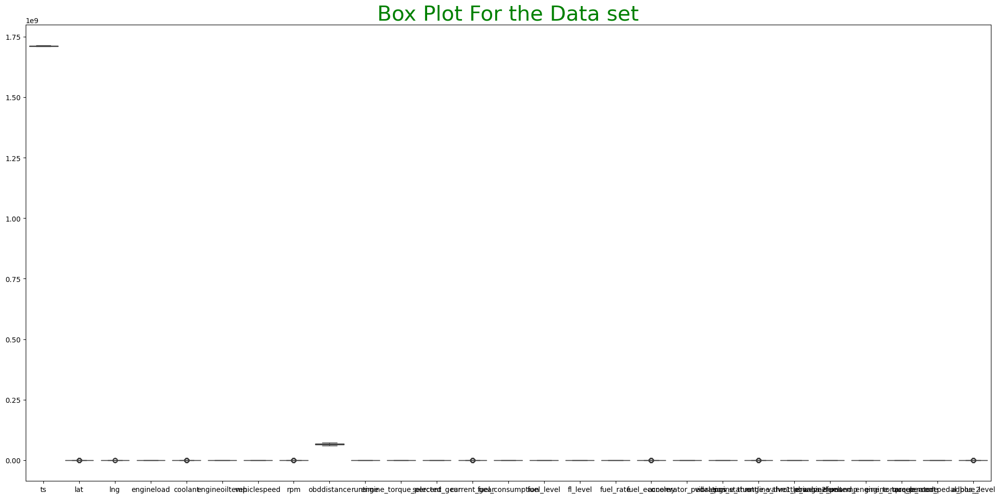

In [40]:
plt.figure(figsize=(20,10))                                  ### Adjusting the width and height
sns.boxplot(df,color='blue')                                 ### IDentifying the outliers
plt.title("Box Plot For the Data set",size=30,color='green')
plt.tight_layout()
plt.show()

In [41]:
### There are no outliers in the dataset

### Exploratory data analysis:

In [43]:
#### Perform univariate analysis on numerical and categorical features.

In [44]:
## For Numerical features

In [45]:
num_cols=df.select_dtypes(include=['int64','float64']).columns

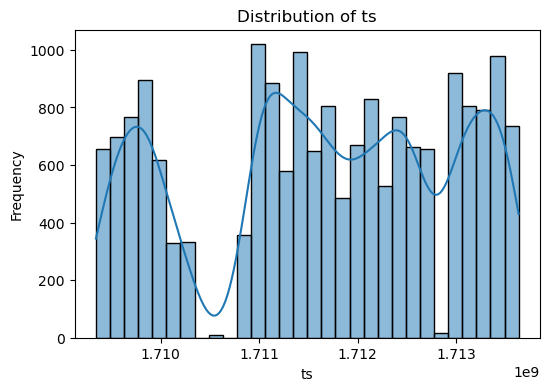

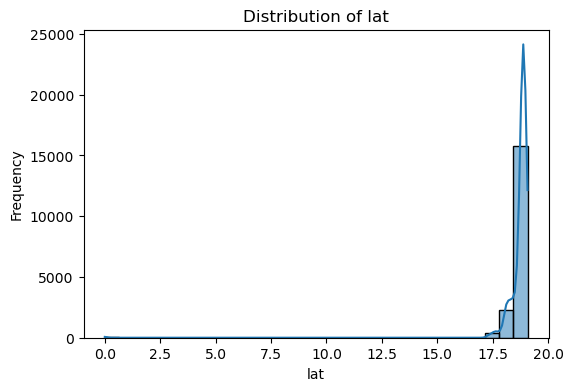

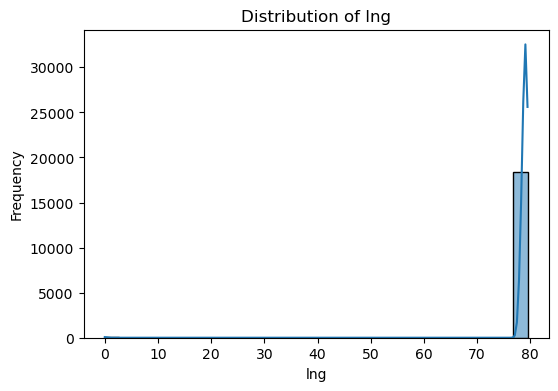

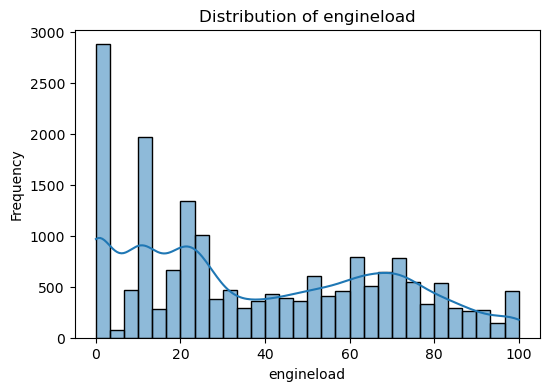

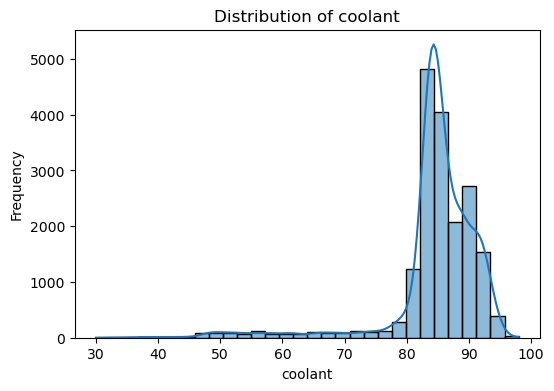

...

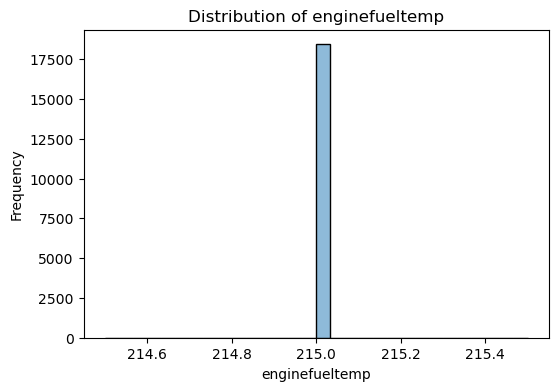

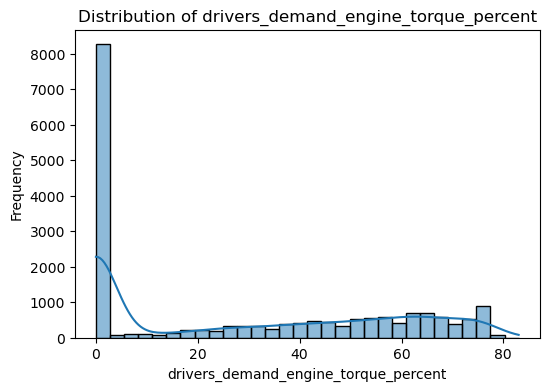

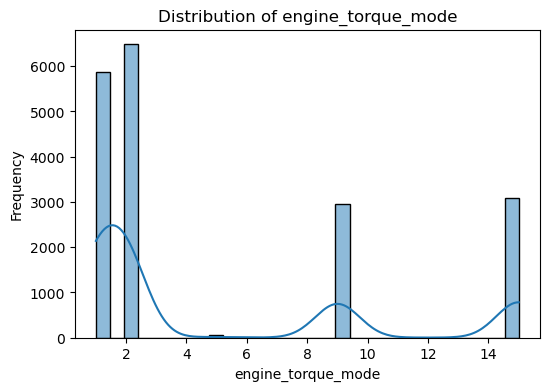

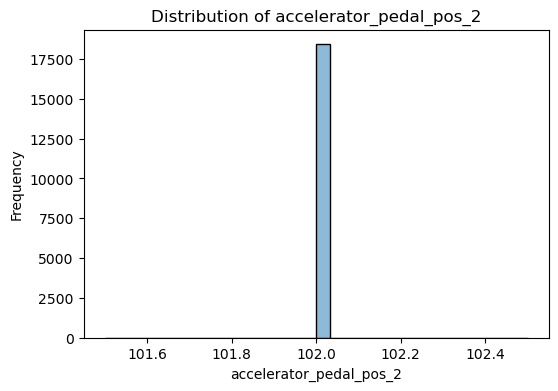

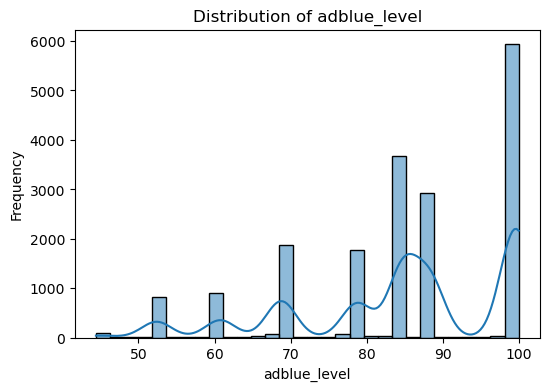

In [46]:
###Histogram plot for individual features

for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [47]:
### For Categorical Features

In [48]:
cat_cols=df.select_dtypes(include=['object']).columns

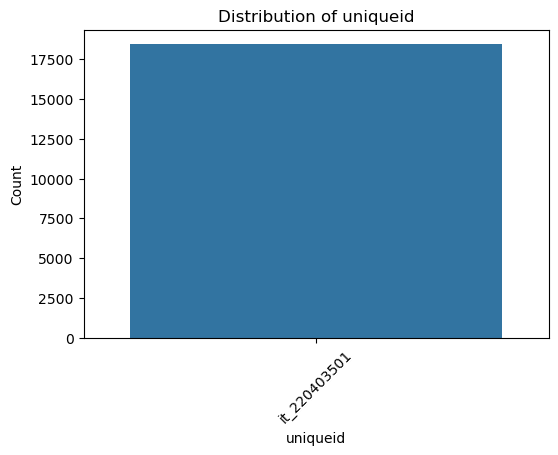

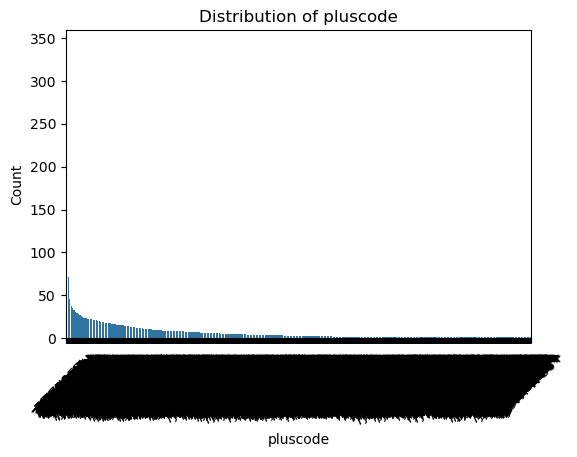

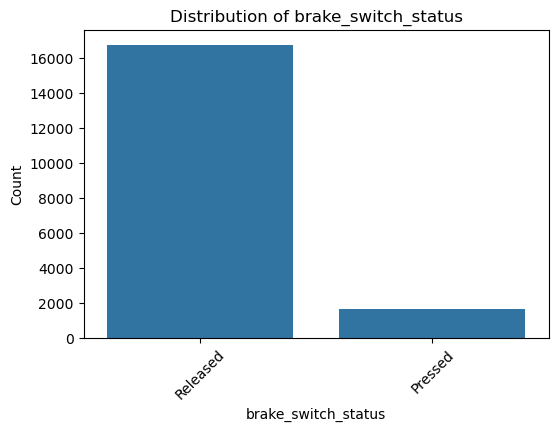

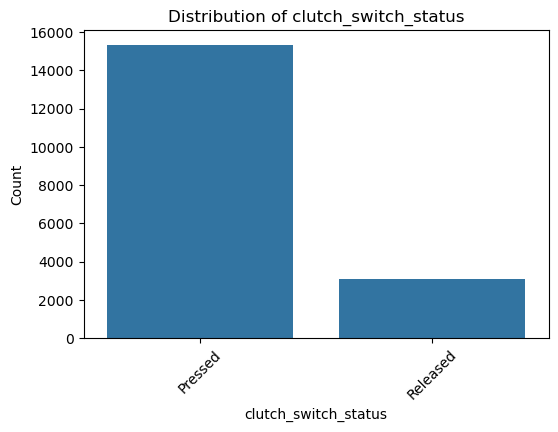

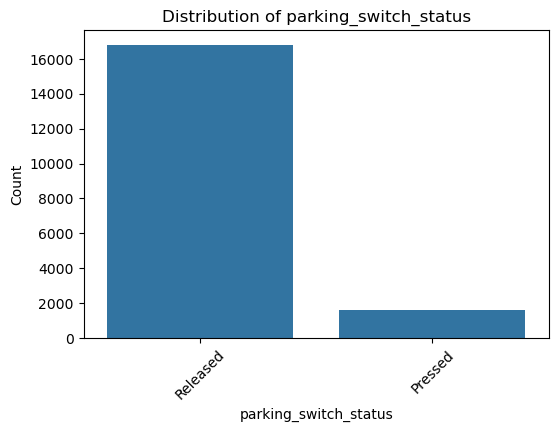

In [49]:
### Count Plot for Categorical features

for col in cat_cols:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=col, data=df, order=df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

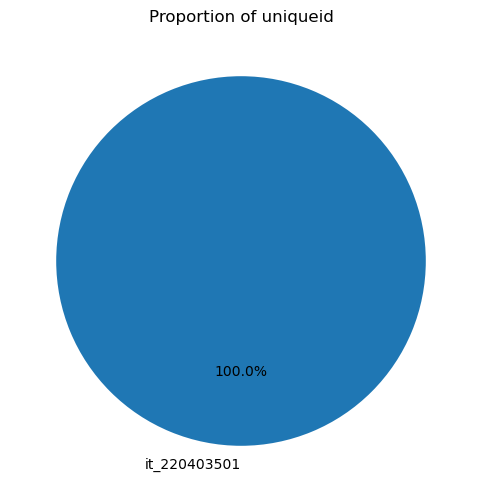

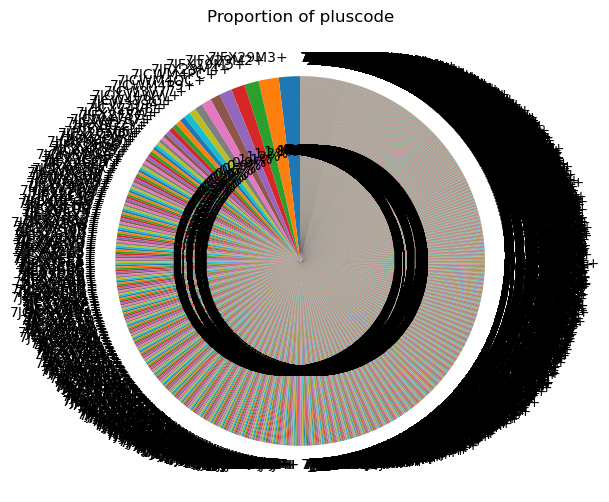

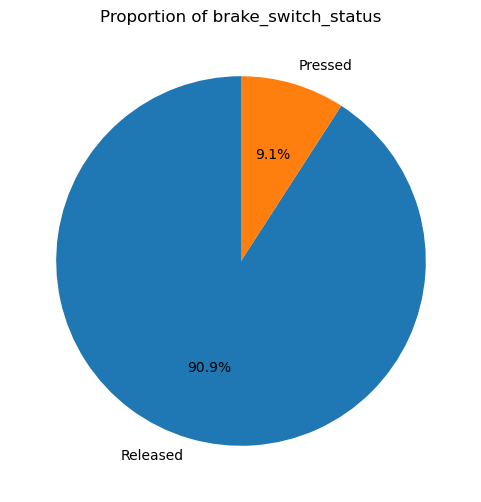

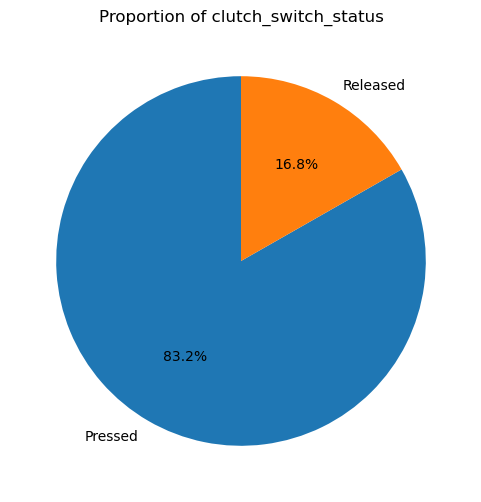

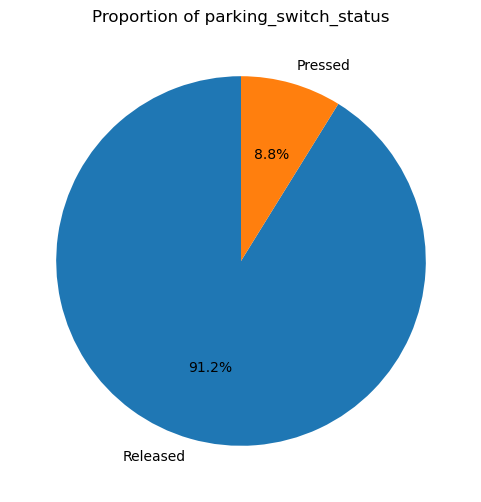

In [50]:
### Pie Chart for categorical features
for col in cat_cols:
    plt.figure(figsize=(6, 6))
    df[col].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title(f'Proportion of {col}')
    plt.ylabel('')
    plt.show()

In [51]:
#### Perform bivariate analysis to find relationships between different variables.

In [52]:
 ## Bi-variate for numerical-numerical columns using scatter plot and correlation analysis

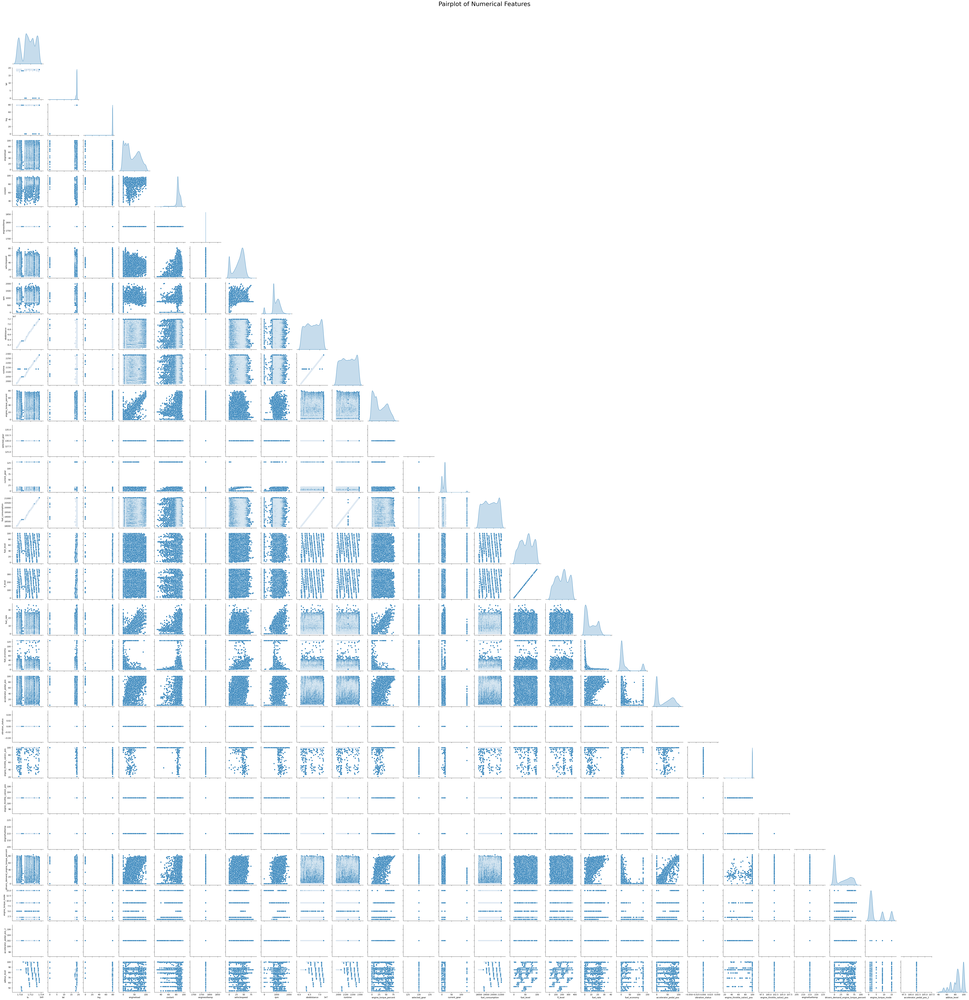

In [53]:
# Scatter plot for numerical variables
sns.pairplot(df[num_cols], diag_kind='kde', corner=True)
plt.suptitle('Pairplot of Numerical Features', y=1.02,size=30)
plt.show()

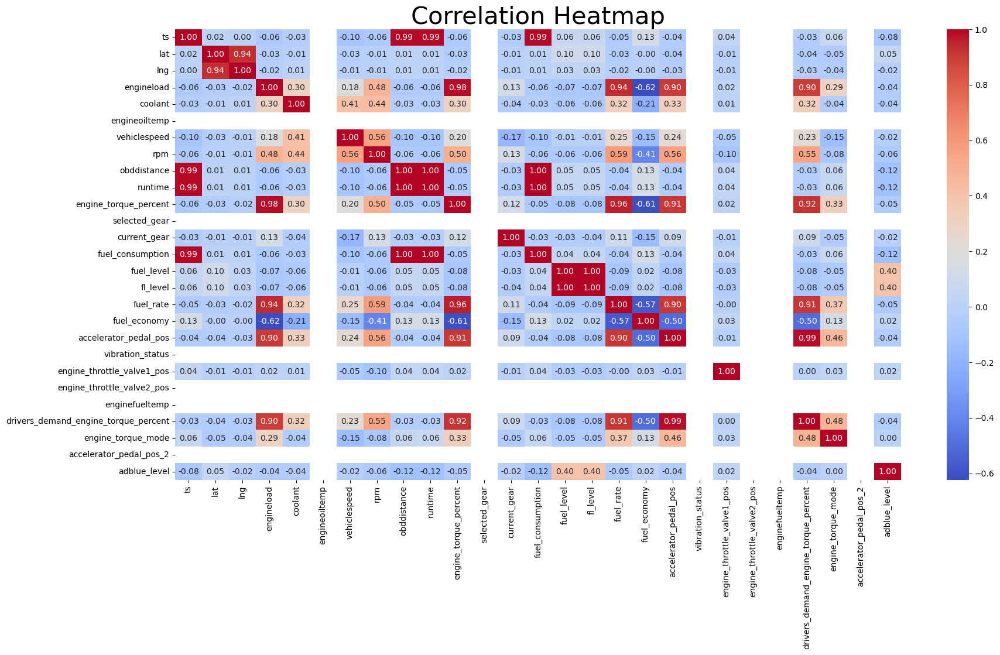

In [54]:
# Correlation heatmap
correlation_matrix = df[num_cols].corr()
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap',size=30)
plt.show()

In [55]:
#### Numerical-Categorical 

C:\Users\SATEESH REDDY\AppData\Local\Temp\ipykernel_9396\3888999867.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='clutch_switch_status', y='fuel_rate', data=df, palette='Set3')


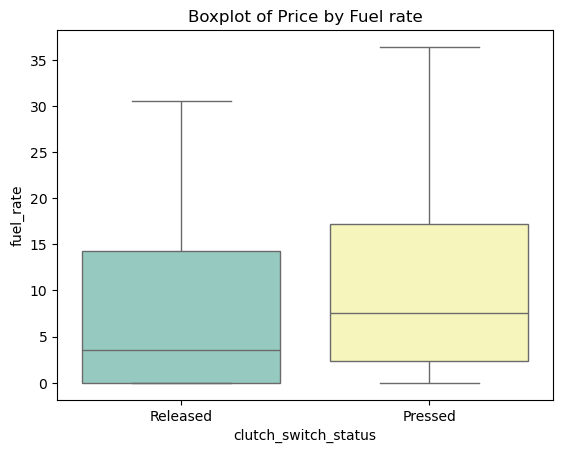

C:\Users\SATEESH REDDY\AppData\Local\Temp\ipykernel_9396\3888999867.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='clutch_switch_status', y='fuel_rate', data=df, palette='Set2')


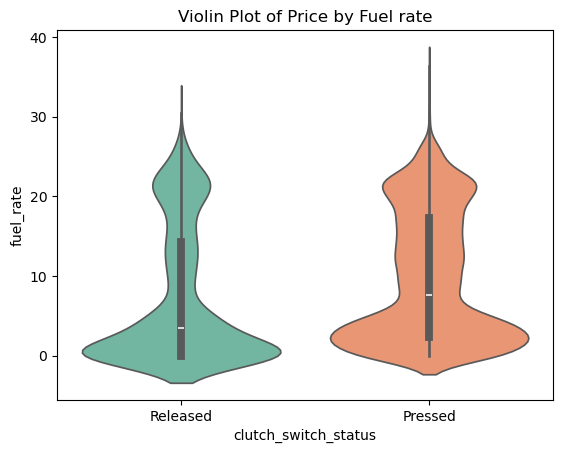

In [56]:
# Example: Comparing 'price' across 'fuel_type'
sns.boxplot(x='clutch_switch_status', y='fuel_rate', data=df, palette='Set3')
plt.title('Boxplot of Price by Fuel rate')
plt.xlabel('clutch_switch_status')
plt.ylabel('fuel_rate')
plt.show()

# Violin plot for better density visualization
sns.violinplot(x='clutch_switch_status', y='fuel_rate', data=df, palette='Set2')
plt.title('Violin Plot of Price by Fuel rate')
plt.xlabel('clutch_switch_status')
plt.ylabel('fuel_rate')
plt.show()


In [57]:
### Categorical-Categorical features

Crosstab of clutch_switch_status and brake switch status:
brake_switch_status   Pressed  Released
clutch_switch_status                   
Pressed                  1621     13725
Released                   61      3027


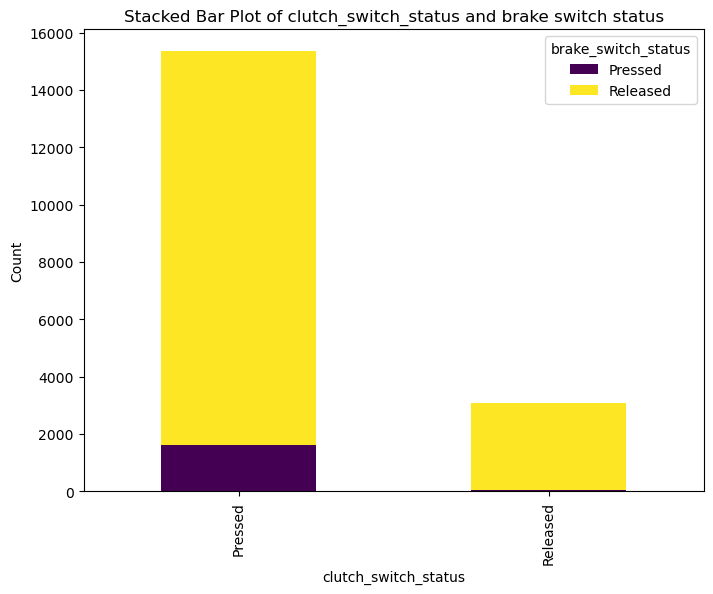

In [58]:
# Crosstab analysis
crosstab = pd.crosstab(df['clutch_switch_status'], df['brake_switch_status'])
print("Crosstab of clutch_switch_status and brake switch status:")
print(crosstab)

# Stacked bar plot
crosstab.plot(kind='bar', stacked=True, figsize=(8, 6), colormap='viridis')
plt.title('Stacked Bar Plot of clutch_switch_status and brake switch status')
plt.xlabel('clutch_switch_status')
plt.ylabel('Count')
plt.legend(title='brake_switch_status')
plt.show()


In [59]:
### There are no outliers and no unusual findings

#### Feature Engineering:

In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18434 entries, 0 to 18433
Data columns (total 32 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   uniqueid                              18434 non-null  object 
 1   ts                                    18434 non-null  int64  
 2   lat                                   18434 non-null  float64
 3   lng                                   18434 non-null  float64
 4   engineload                            18434 non-null  int64  
 5   coolant                               18434 non-null  int64  
 6   engineoiltemp                         18434 non-null  float64
 7   vehiclespeed                          18434 non-null  float64
 8   rpm                                   18434 non-null  float64
 9   obddistance                           18434 non-null  int64  
 10  runtime                               18434 non-null  float64
 11  engine_torque_p

In [62]:
### Create new features from existing data that could provide additional insights.

In [63]:
df['accelerator_efficiency'] = df['accelerator_pedal_pos'] / df['vehiclespeed']
df['fuel_efficiency_index'] = df['fuel_level'] / df['fuel_economy']
df['throttle_efficiency'] = df['accelerator_pedal_pos'] / df['engine_torque_percent']

In [64]:
df

,uniqueid,ts,lat,lng,engineload,coolant,engineoiltemp,vehiclespeed,rpm,obddistance,...,drivers_demand_engine_torque_percent,engine_torque_mode,accelerator_pedal_pos_2,brake_switch_status,clutch_switch_status,parking_switch_status,adblue_level,accelerator_efficiency,fuel_efficiency_index,throttle_efficiency
0,it_220403501,1709340731,19.069340,78.355148,28,33,1774.9688,0.00000,749.000,60780800,...,0,1,102,Released,Released,Pressed,84.795315,NaN,inf,0.000000
1,it_220403501,1709340794,19.069347,78.355141,22,41,1774.9688,0.00000,1208.375,60780800,...,19,2,102,Released,Pressed,Pressed,84.795315,inf,inf,1.311111
2,it_220403501,1709340857,19.069414,78.355179,25,48,1774.9688,1.40625,752.625,60780800,...,0,1,102,Pressed,Pressed,Released,84.795315,0.000000,67.477458,0.000000
3,it_220403501,1709340920,19.069258,78.355225,35,52,1774.9688,2.81250,996.375,60780820,...,28,2,102,Released,Pressed,Released,84.795315,11.946667,168.464516,1.244444
4,it_220403501,1709340983,19.069094,78.355339,0,57,1774.9688,4.53125,1065.750,60780840,...,1,2,102,Released,Pressed,Released,84.795315,0.706207,0.184861,3.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18429,it_220403501,1713635865,18.869371,79.020393,50,89,1774.9688,14.28125,945.125,71872976,...,34,2,102,Released,Pressed,Released,60.800000,3.249015,46.214892,1.406061
18430,it_220403501,1713635929,18.867130,79.018272,0,92,1774.9688,38.28125,1130.750,71873344,...,0,2,102,Released,Pressed,Released,60.800000,0.000000,0.643825,NaN
18431,it_220403501,1713635993,18.862076,79.013924,10,87,1774.9688,32.34375,749.750,71874064,...,0,1,102,Released,Pressed,Released,60.800000,0.000000,4.654545,0.000000
18432,it_220403501,1713636056,18.859493,79.011673,52,87,1774.9688,17.71875,820.625,71874464,...,46,9,102,Released,Pressed,Released,60.800000,3.183069,41.042915,1.446154


In [65]:
from sklearn.impute import SimpleImputer        ### Package to fill the missing values

In [66]:
# Replace infinity values with NaN (or another value, if preferred)
df.replace([np.inf, -np.inf], np.nan, inplace=True)

In [67]:
num=[i for i in df.columns if df[i].dtype!='O']
cat=[i for i in df.columns if df[i].dtype=='O']
simp=SimpleImputer(missing_values=np.nan,strategy='mean')
df_num=pd.DataFrame(simp.fit_transform(df[num]),columns=df[num].columns)

In [68]:
df=pd.concat([df_num,df[cat]],axis=1)

In [69]:
### Standardize or normalize features if necessary.

In [70]:
from sklearn.preprocessing import StandardScaler

In [71]:
st=StandardScaler()
df_n=pd.DataFrame(st.fit_transform(df_num),columns=df_num.columns)

In [72]:
df=pd.concat([df_n,df[cat]],axis=1)

In [73]:
df

,ts,lat,lng,engineload,coolant,engineoiltemp,vehiclespeed,rpm,obddistance,runtime,...,accelerator_pedal_pos_2,adblue_level,accelerator_efficiency,fuel_efficiency_index,throttle_efficiency,uniqueid,pluscode,brake_switch_status,clutch_switch_status,parking_switch_status
0,-1.803203,0.422815,-0.159044,-0.339301,-6.681837,4.547474e-13,-1.860761,-0.575067,-1.756611,-1.748194,...,0.0,0.000000,0.000000,-8.799946e-18,-0.939156,it_220403501,7JFW3994+,Released,Released,Pressed
1,-1.803154,0.422824,-0.159046,-0.540047,-5.645318,4.547474e-13,-1.860761,0.829771,-1.756611,-1.748194,...,0.0,0.000000,0.000000,-8.799946e-18,0.311661,it_220403501,7JFW3994+,Released,Pressed,Pressed
2,-1.803105,0.422906,-0.159034,-0.439674,-4.738363,4.547474e-13,-1.782327,-0.563981,-1.756611,-1.748194,...,0.0,0.000000,-0.425993,9.879225e-02,-0.939156,it_220403501,7JFW3994+,Pressed,Pressed,Released
3,-1.803055,0.422715,-0.159020,-0.105097,-4.220103,4.547474e-13,-1.703893,0.181443,-1.756605,-1.747653,...,0.0,0.000000,3.322759,3.489336e-01,0.248060,it_220403501,7JFW3994+,Released,Pressed,Released
4,-1.803006,0.422514,-0.158984,-1.276114,-3.572279,4.547474e-13,-1.608030,0.393602,-1.756599,-1.747653,...,0.0,0.000000,-0.204392,-6.788912e-02,2.113685,it_220403501,7JFW3994+,Released,Pressed,Released
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18429,1.563146,0.177804,0.048331,0.396767,0.573800,4.547474e-13,-1.064221,0.024713,1.649821,1.672725,...,0.0,-1.721625,0.593518,4.612563e-02,0.402244,it_220403501,7JCXV29C+,Released,Pressed,Released
18430,1.563196,0.175058,0.047669,-1.276114,0.962495,4.547474e-13,0.274386,0.592382,1.649934,1.673267,...,0.0,-1.721625,-0.425993,-6.675229e-02,0.000000,it_220403501,7JCXV289+,Released,Pressed,Released
18431,1.563246,0.168866,0.046314,-0.941538,0.314670,4.547474e-13,-0.056780,-0.572774,1.650155,1.673267,...,0.0,-1.721625,-0.425993,-5.681787e-02,-0.939156,it_220403501,7JCXV267+,Released,Pressed,Released
18432,1.563296,0.165701,0.045612,0.463682,0.314670,4.547474e-13,-0.872493,-0.356027,1.650278,1.673267,...,0.0,-1.721625,0.572824,3.331483e-02,0.440493,it_220403501,7JCXV256+,Released,Pressed,Released


### Insights and Recommendations:

In [75]:
#### Provide a summary of the key insights derived from your analysis.
#### Based on your findings, make recommendations that could help improve vehicle performance, fuel efficiency, safety, or emissions.

In [76]:
### 1.Accelerator Efficiency (accelerator_efficiency)
### Formula: df['accelerator_efficiency'] = df['accelerator_pedal_pos'] / df['vehiclespeed']
#### Description: This feature measures the efficiency of throttle usage relative to the vehicle speed. Higher values could indicate aggressive acceleration, where the driver is using more throttle than necessary for the vehicle speed.
### Insights: A high accelerator_efficiency value at low vehicle speeds may suggest inefficient or aggressive driving. By controlling accelerator usage, drivers can potentially reduce fuel consumption.
### Recommendation: Drivers should maintain a consistent and moderate throttle position to ensure optimal fuel usage, especially at lower speeds. Systems could be introduced to monitor and provide feedback on efficient throttle usage.

In [77]:
### 2. Fuel Efficiency Index (fuel_efficiency_index)
### Formula: df['fuel_efficiency_index'] = df['fuel_level'] / df['fuel_economy']
### Description: This feature evaluates how efficiently the fuel is being utilized given the current fuel level. Higher values suggest better fuel efficiency.
### Insights: A higher fuel efficiency index indicates better utilization of fuel in relation to the current fuel economy. If the index is low, it may suggest issues with fuel delivery or the engine's inability to effectively convert fuel into energy.
### Recommendation: If this index is low, it could signal that the vehicle's fuel delivery system or engine efficiency needs attention. Preventive maintenance such as fuel injector cleaning, regular oil changes, and fuel system checks can help improve this efficiency.

In [78]:
### 3.Throttle Efficiency (throttle_efficiency)
#### Formula: df['throttle_efficiency'] = df['accelerator_pedal_pos'] / df['engine_torque_percent']
### Description: This feature measures how efficiently the throttle is used in relation to the engine's torque output. A high value could indicate that a high throttle position is being used for relatively low engine torque.
### Insights: A high throttle_efficiency value might suggest aggressive driving behavior where the driver is applying more throttle than necessary for the required torque. This can lead to higher fuel consumption and potential engine strain.
### Recommendation: Drivers should aim to match throttle usage with the engine’s demand for torque. Feedback systems could be introduced to notify drivers when they are using excessive throttle for low torque needs.

### Report

In [131]:
### Report Sections
### Title: Vehicle Performance and Fuel Efficiency Analysis
## Abstract: A brief summary of the goals, methodology, and findings from the analysis.
### Introduction: Objective of the analysis, dataset description, and scope.
### Methodology: Explanation of the techniques used for data analysis, feature engineering, and modeling.
## Analysis: Detailed results from the EDA, including visualizations, correlation insights, and feature engineering results.
###Findings and Insights: Key observations and insights drawn from the data analysis.
### Recommendations: Practical suggestions based on the analysis to improve vehicle performance, fuel efficiency, and reduce emissions.
### Conclusion: A summary of the analysis and future work suggestions

In [156]:
### # Vehicle Performance and Fuel Efficiency Analysis

## Abstract
# This report provides an analysis of a dataset containing various parameters of vehicle performance. Through exploratory data analysis (EDA) and feature engineering, the analysis aims to uncover insights regarding fuel efficiency, engine performance, and driving behavior. Based on the findings, actionable recommendations are provided to optimize vehicle performance and reduce emissions.

## Introduction
# The dataset used in this analysis includes several parameters like vehicle speed, RPM, fuel consumption, and engine torque. The primary objective is to examine the relationships between these parameters and identify ways to improve fuel efficiency and vehicle performance.

## Methodology
## Data Cleaning: The dataset was cleaned by handling missing values, removing duplicates, and addressing outliers.
## Feature Engineering: Several new features were created to understand the relationship between different parameters better.
### Exploratory Data Analysis: Visualizations like histograms, scatter plots, and correlation matrices were used to explore the data.

## Analysis
### Univariate Analysis: We explored the distribution of numerical features such as `vehiclespeed`, `rpm`, and `fuel_consumption`.
###Bivariate Analysis: We examined relationships between variables like `vehiclespeed` and `rpm` to understand how they influence each other.

## Findings and Insights
### A positive correlation between `vehiclespeed` and `rpm` suggests that increasing speed leads to higher engine RPM.
### Higher `accelerator_efficiency` values indicate aggressive driving, leading to increased fuel consumption.

## Recommendations
### Encourage smoother acceleration to improve fuel efficiency
### Optimize gear shifts to match vehicle speed, reducing engine load and improving fuel economy.

## Conclusion
### The analysis revealed that improving driving habits and optimizing vehicle systems can lead to better fuel efficiency and reduced emissions. Future work could focus on integrating real-time feedback systems to guide drivers in improving their driving behavior.
